# LTN boundary

How we determine the boundary polygon of an LTN, with an actual example.

In [96]:
from datetime import datetime

import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import shapely as shp

import superblockify as sb
from superblockify.config import logger, PLACES_SMALL

In [2]:
PLACES_SMALL

[('Adliswil', 'Adliswil, Bezirk Horgen, Zürich, Switzerland'),
 ('MissionTown', '团城山街道, Xialu, Hubei, China'),
 ('Scheveningen', 'Scheveningen, The Hague, Netherlands')]

2023-06-07 07:18:53,926 |     INFO | 166136007.py:5 | Running partitioner for Scheveningen with search string Scheveningen, The Hague, Netherlands.
2023-06-07 07:18:53,927 |    DEBUG | base.py:749 | Loading graph from ./data/graphs/Scheveningen.graphml
2023-06-07 07:18:54,055 |    DEBUG | utils.py:200 | Removed 9 dead ends.
2023-06-07 07:18:54,137 |     INFO | utils.py:153 | Highway counts (type, count, proportion): 
                             count  proportion
highway                                       
residential                   1841    0.801829
secondary                      252    0.109756
tertiary                       113    0.049216
living_street                   63    0.027439
unclassified                    22    0.009582
[residential, unclassified]      3    0.001307
secondary_link                   1    0.000436
trunk                            1    0.000436
2023-06-07 07:18:54,141 |    DEBUG | utils.py:159 | Dtype counts (type, count, proportion): 
                

/home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/osmnx/plot.py:219: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(


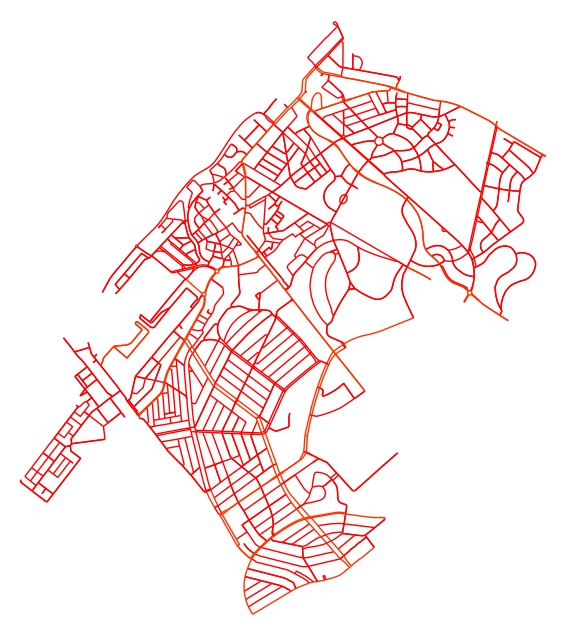

2023-06-07 07:18:58,541 |    DEBUG | plot.py:653 | Saving plot () to ./data/results/Scheveningen_main/Scheveningen_main_partition_graph.pdf
2023-06-07 07:19:00,560 |    DEBUG | plot.py:273 | Using components for plotting.
2023-06-07 07:19:00,580 |    DEBUG | attribute.py:183 | Given minmax_val for edge attribute residential: (0, 26)
2023-06-07 07:19:00,581 |    DEBUG | plot.py:518 | Plotting component/partition sizes for Scheveningen_main.
2023-06-07 07:19:00,595 |    DEBUG | plot.py:653 | Saving plot (Component size of Scheveningen_main) to ./data/results/Scheveningen_main/Scheveningen_main_subgraph_component_size.pdf
2023-06-07 07:19:01,169 |    DEBUG | backend_pdf.py:943 | Assigning font /F1 = '/home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
2023-06-07 07:19:01,248 |    DEBUG | backend_pdf.py:989 | Embedding font /home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/matplotlib/mpl-data/fonts/ttf/

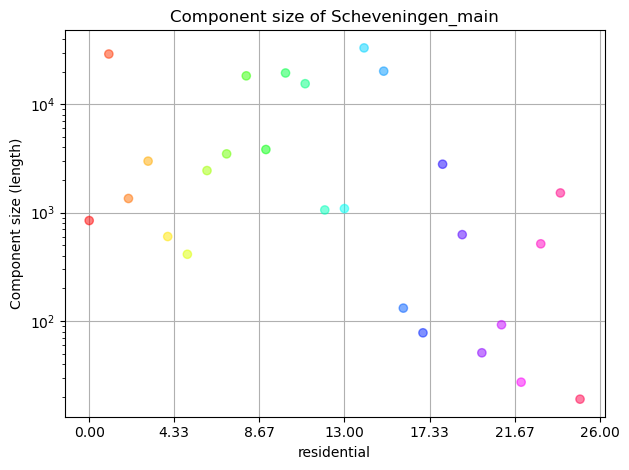

2023-06-07 07:19:01,639 |    DEBUG | plot.py:175 | Using components for plotting.
2023-06-07 07:19:01,640 |     INFO | plot.py:193 | Plotting component size rank for Scheveningen_main with attribute `residential`
2023-06-07 07:19:01,972 |    DEBUG | plot.py:653 | Saving plot (Component size rank for Scheveningen_main with attribute `residential`) to ./data/results/Scheveningen_main/Scheveningen_main_component_rank_size.pdf
2023-06-07 07:19:02,099 |    DEBUG | backend_pdf.py:943 | Assigning font /F1 = '/home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
2023-06-07 07:19:02,187 |    DEBUG | backend_pdf.py:989 | Embedding font /home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
2023-06-07 07:19:02,187 |    DEBUG | backend_pdf.py:996 | Writing TrueType font.


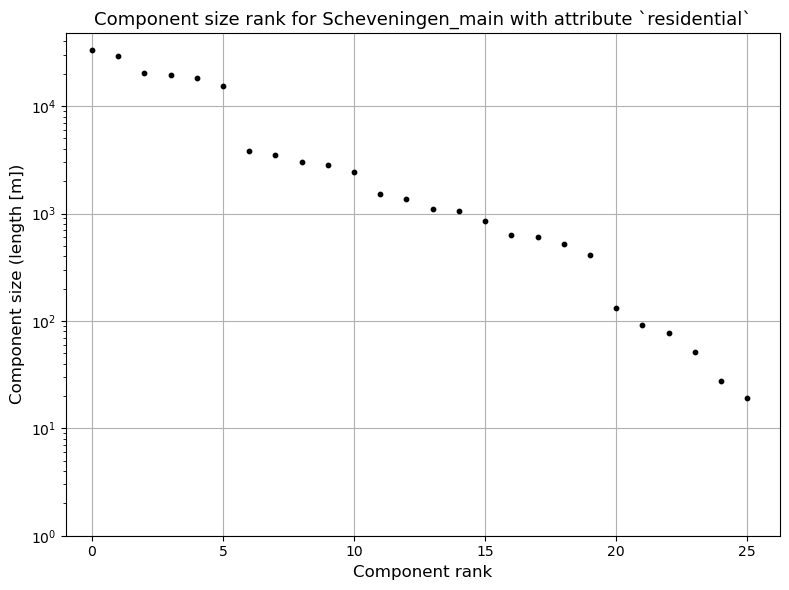

2023-06-07 07:19:02,656 |     INFO | plot.py:92 | Plotting component graph for Scheveningen_main with attribute `residential`
2023-06-07 07:19:02,831 |    DEBUG | plot.py:168 | Unique colors in the edge colormap <matplotlib.colors.LinearSegmentedColormap object at 0x7fa0e7b6cee0> (len 2310): {(0.0, 0.3803200527327915, 0.7238783816186963, 1.0), (1.0, 0.6555911844148508, 0.0, 1.0), (0.0, 0.45553206538175656, 0.6366568394132025, 1.0), (0.0, 0.15109990681607144, 0.9409006861765502, 1.0), (0.5235689797883887, 0.0, 0.9147106760643515, 1.0), (0.5608947920852816, 0.0, 0.8826950541573693, 1.0), (1.0, 0.8450918051812084, 0.0, 1.0), (1.0, 0.897444304427925, 0.0, 1.0), (0.3986380006273018, 1.0, 0.0, 1.0), (1.0, 0.8719592988967217, 0.0, 1.0), (0.4342863524253539, 1.0, 0.0, 1.0), (0.24310366462004168, 0.0, 1.0, 1.0), (0.36368186826079163, 1.0, 0.0, 1.0), (0.0, 0.4180383479099588, 0.6811363685419927, 1.0), (0.0, 0.1145533634080611, 0.9684715435193139, 1.0), (0.6990986266378024, 1.0, 0.0, 1.0), (0.486

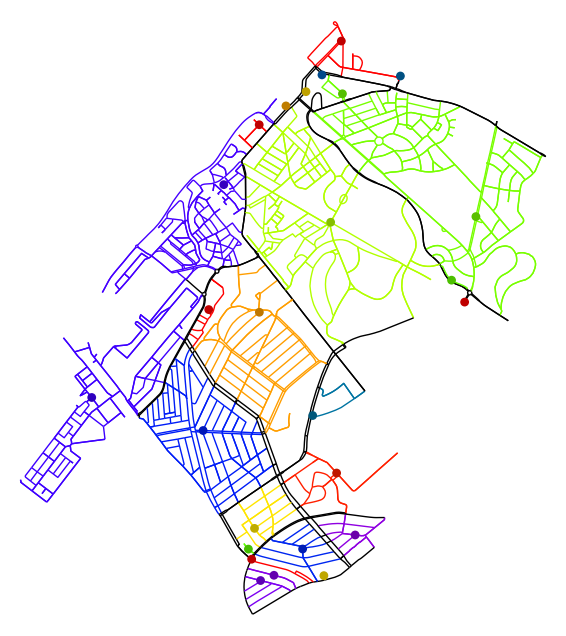

2023-06-07 07:19:03,408 |    DEBUG | plot.py:653 | Saving plot () to ./data/results/Scheveningen_main/Scheveningen_main_component_graph.pdf
2023-06-07 07:19:03,918 |    DEBUG | attribute.py:183 | Given minmax_val for edge attribute speed_kph: None
2023-06-07 07:19:03,927 |    DEBUG | attribute.py:226 | Determined minmax_val for edge attribute speed_kph: (15.0, 50.0)
2023-06-07 07:19:03,946 |    DEBUG | attribute.py:183 | Given minmax_val for edge attribute speed_kph: (15.0, 50.0)
2023-06-07 07:19:04,175 |    DEBUG | plot.py:168 | Unique colors in the edge colormap viridis (len 2310): {(0.993248, 0.906157, 0.143936, 1.0), (0.153364, 0.497, 0.557724, 1.0), (0.288921, 0.758394, 0.428426, 1.0), (0.132268, 0.655014, 0.519661, 1.0), (0.267004, 0.004874, 0.329415, 1.0)}
2023-06-07 07:19:04,761 |    DEBUG | attribute.py:183 | Given minmax_val for edge attribute speed_kph_restricted: (15.0, 50.0)


/home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/osmnx/plot.py:219: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(


2023-06-07 07:19:04,939 |    DEBUG | plot.py:168 | Unique colors in the edge colormap viridis (len 2310): {(0.993248, 0.906157, 0.143936, 1.0), (0.267004, 0.004874, 0.329415, 1.0)}
2023-06-07 07:19:05,469 |    DEBUG | plot.py:653 | Saving plot (Original speed limits) to ./data/results/Scheveningen_main/Scheveningen_main_speed_un_restricted.pdf
2023-06-07 07:19:05,470 |    DEBUG | plot.py:665 | Not using tight_layout because one of the axes has no subplotspec.


/home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/osmnx/plot.py:219: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(


2023-06-07 07:19:05,779 |    DEBUG | backend_pdf.py:943 | Assigning font /F1 = '/home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
2023-06-07 07:19:06,161 |    DEBUG | backend_pdf.py:989 | Embedding font /home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
2023-06-07 07:19:06,162 |    DEBUG | backend_pdf.py:996 | Writing TrueType font.


/home/carlsonb/sciebo/Physics/22_23-MA_Thesis/Code/Superblockify/superblockify/partitioning/base.py:250: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


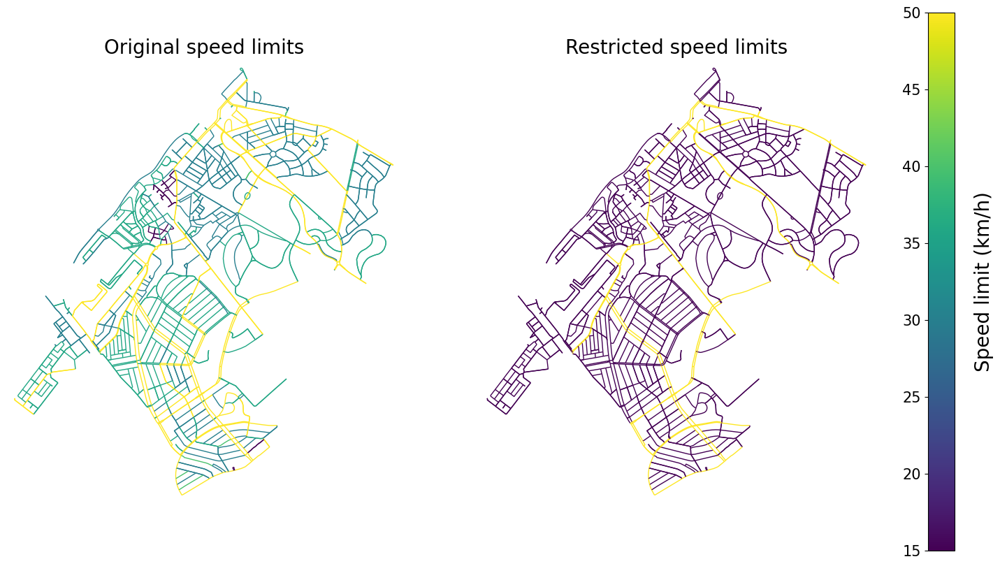

In [3]:
# CITY_NAME, SEARCH_STR = PLACES_GENERAL[2]
CITY_NAME, SEARCH_STR = PLACES_SMALL[2]
# CITY_NAME, SEARCH_STR = PLACES_OTHER[1]

logger.info(
    "Running partitioner for %s with search string %s.", CITY_NAME, SEARCH_STR
)

part = sb.ResidentialPartitioner(
    name=CITY_NAME + "_main", city_name=CITY_NAME, search_str=SEARCH_STR
)

part.run(calculate_metrics=False, make_plots=True)

## Buffer subgraphs - concave border

In [4]:
# show partitions
subgraph = part.partitions[6]["subgraph"]
subgraph_edges = ox.graph_to_gdfs(subgraph, nodes=False, edges=True)
subgraph_edges.explore()

<Axes: >

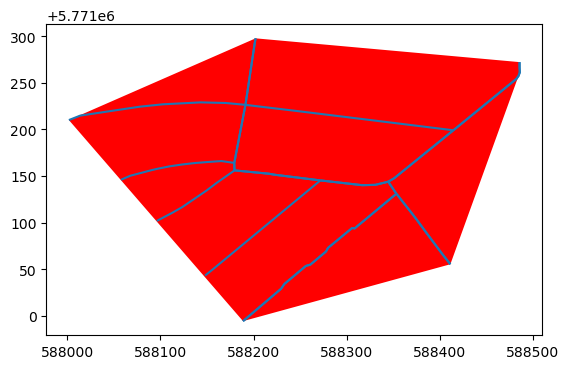

In [5]:
# from subgraph_edges we want to get a hull
# it should include all topologically enclosed areas and have a border on the outer edges
# we can use the convex hull of the nodes
convex_hull = subgraph_edges.unary_union.convex_hull
# Make gdf from convex hull with the same crs as the subgraph
convex_hull_gdf = gpd.GeoDataFrame(
    geometry=[convex_hull], crs=subgraph_edges.crs
)
# plot both gdfs together
ax = subgraph_edges.plot()
convex_hull_gdf.plot(ax=ax, color="red")


<Axes: >

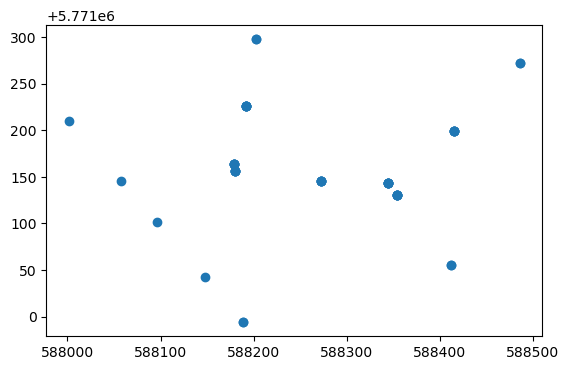

In [6]:
subgraph_edges.boundary.plot()

/tmp/ipykernel_337985/1973222981.py:2: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  subgraph_edges.explode().unary_union.boundary


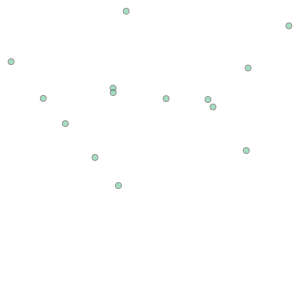

In [7]:
# Shapely MultiLineString geometry
subgraph_edges.explode().unary_union.boundary


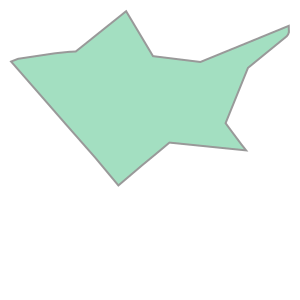

In [8]:
# Concave hull of the edges
shp.concave_hull(
    subgraph_edges.unary_union,
    ratio=0.4,
    allow_holes=True,
)

In [9]:
def plot_concave_hull(ax, subgraph_edges, ratio=0.4, allow_holes=False):
    concave_hull = shp.concave_hull(
        subgraph_edges.unary_union,
        ratio=ratio,
        allow_holes=allow_holes,
    )
    # Make gdf from convex hull with the same crs as the subgraph
    convex_hull_gdf = gpd.GeoDataFrame(
        geometry=[concave_hull], crs=subgraph_edges.crs
    )
    # plot both gdfs together
    subgraph_edges.plot(ax=ax)
    convex_hull_gdf.plot(ax=ax, color="crimson")

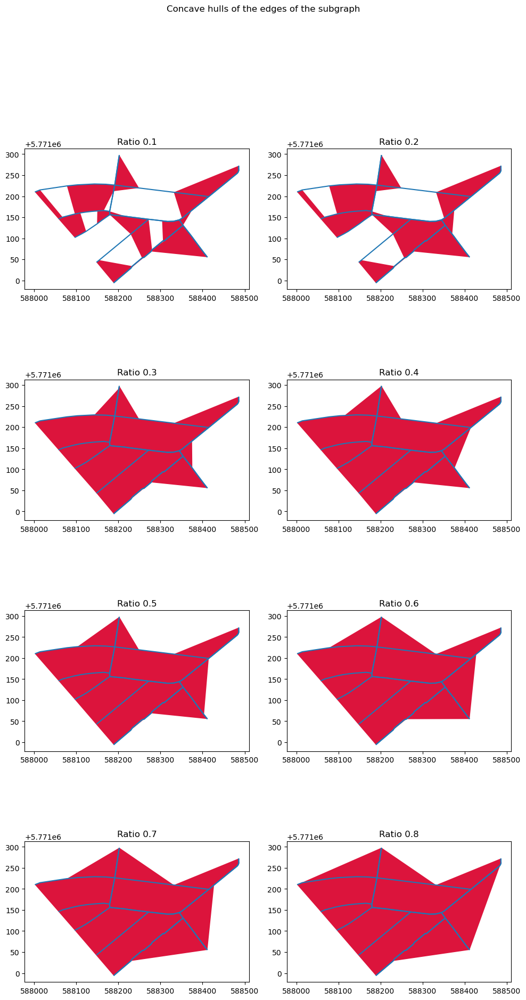

In [10]:
# Figure with values of ratio 0.1 to 0.9
fig, axs = plt.subplots(4, 2, figsize=(10, 20))
for i in range(1, 9):
    ax = axs[(i - 1) // 2, (i - 1) % 2]
    plot_concave_hull(ax, subgraph_edges, ratio=i / 10.)
    ax.set_title(f"Ratio {i / 10}")

fig.suptitle("Concave hulls of the edges of the subgraph")
fig.tight_layout()
fig.subplots_adjust(top=0.9)
plt.show()

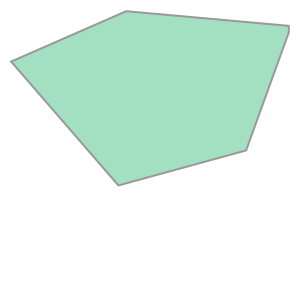

In [11]:
# Make multilinestring from the edges
subgraph_edges_multilinestring = shp.MultiLineString(subgraph_edges.geometry.values)
subgraph_edges_multilinestring.convex_hull

In [60]:
def border_from_subgraph(subgraph, buffer=2):
    edges = ox.graph_to_gdfs(subgraph, nodes=False, edges=True)
    return edges.unary_union.buffer(buffer, cap_style='flat').buffer(-buffer / 2)

In [56]:
gpd.GeoDataFrame(
    geometry=[border_from_subgraph(p["subgraph"]) for p in part.partitions],
    crs=part.partitions[0]["subgraph"].graph["crs"]
).explore()

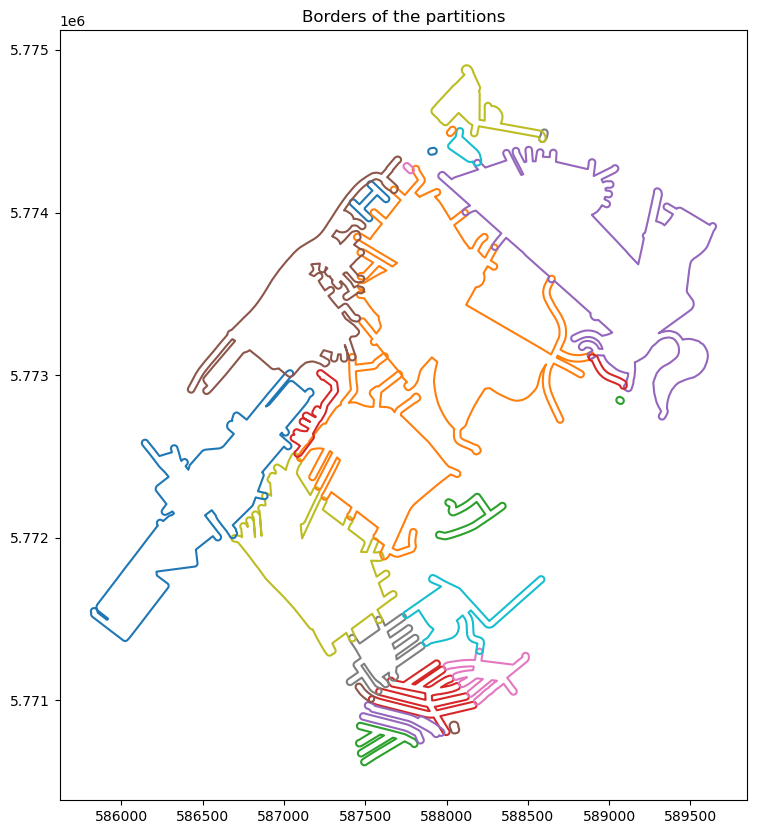

In [15]:
# Now the same, but color every partition differently
fig, ax = plt.subplots(figsize=(10, 10))
for i, p in enumerate(part.partitions):
    border = border_from_subgraph(p["subgraph"])
    gpd.GeoDataFrame(
        geometry=[border],
        crs=p["subgraph"].graph["crs"]
    ).plot(ax=ax, color=f"C{i}")
    ax.set_title("Borders of the partitions")

plt.show()

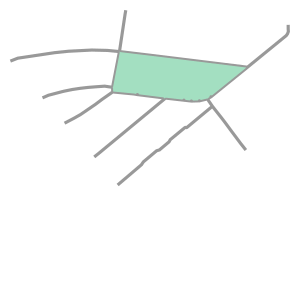

In [261]:
def border_from_subgraph_shrinked(subgraph, buffer=1):
    """Shrinked subgraph borders, to avoid overlap between partitions.
    Does work well with small buffer values."""
    edges = ox.graph_to_gdfs(subgraph, nodes=False, edges=True)
    # First buffer with flat cap style to avoid self-intersections
    polygon = shp.Polygon(edges.unary_union.buffer(2 * buffer, cap_style='flat')
                          .exterior)
    # Simplify the polygon to remove small artifacts of flat cap style at curved edges
    # polygon = polygon.simplify(buffer*2, preserve_topology=True)
    # Here the simple Ramer–Douglas–Peucker algorithm does not suffice our needs,
    # because the result does not inherently enclose the original polygon.
    # geos::simplify::PolygonHullSimplifier would do the job.
    # It got added in GEOS 3.11, but no python package has any bindings, yet.
    # https://libgeos.org/doxygen/classgeos_1_1simplify_1_1PolygonHullSimplifier.html
    # http://lin-ear-th-inking.blogspot.com/2022/04/outer-and-inner-concave-polygon-hulls.html
    # http://lin-ear-th-inking.blogspot.com/2022/05/using-outer-hulls-for-smoothing.html
    # Also low-res smoothing could be a solution - taking all midpoints and buffering
    # slightly

    # Second erode the polygon to avoid overlap between partitions
    return polygon.buffer(-buffer, cap_style='round')


border_from_subgraph_shrinked(part.partitions[6]["subgraph"], buffer=1)

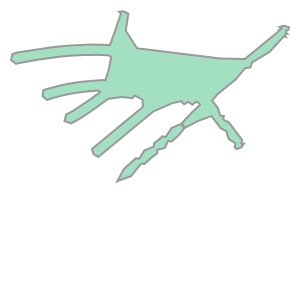

In [252]:
def border_from_subgraph_smoothed(subgraph, buffer=10):
    """Smoothed subgraph borders, to avoid overlap between partitions.
    Works better with larger buffer values."""
    edges = ox.graph_to_gdfs(subgraph, nodes=False, edges=True)
    # First buffer with flat cap style to avoid self-intersections
    lin_ring = edges.unary_union.buffer(buffer, cap_style='flat').exterior
    # Smoothen the linear ring, taking the midpoints of the edges
    lin_ring = shp.LinearRing(
        [shp.Point((x1 + x2) / 2, (y1 + y2) / 2) for (x1, y1), (x2, y2) in zip(
            lin_ring.coords[:-1], lin_ring.coords[1:]
        )]
    )
    # Second erode the polygon to avoid overlap between partitions
    return shp.Polygon(lin_ring).buffer(-buffer / 10, cap_style='round')


border_from_subgraph_smoothed(part.partitions[6]["subgraph"], buffer=10)

## Morphological tessellation

Use borders of partitions with smaller (but positive) buffer to generate
morphological tessellation (MT). The difference to the usual usage is that we use the
borders instead of building footprints.

See Momepy
[Morphological tessellation](http://docs.momepy.org/en/stable/user_guide/elements/tessellation.html#Morphological-tessellation).

In [253]:
import momepy as mm

In [254]:
# Add borders to the partitions
borders = gpd.GeoDataFrame(
    geometry=[border_from_subgraph_shrinked(p["subgraph"], buffer=1) for p in part
    .partitions],
    crs=part.partitions[0]["subgraph"].graph["crs"],
    data=[p["name"] for p in part.partitions],
    columns=["partition_id"]
)
# # We do not want overlap between the partitions, so we
# borders = borders.dissolve(by="partition_id")
# gpd.GeoDataFrame(geometry=borders.geometry, crs=borders.crs).explore(column="partition_id")

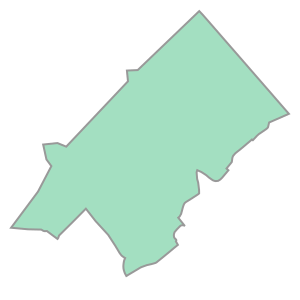

In [220]:
# Get the graphs boundary polygon
part.graph.graph["boundary"]

### Morphological tessellation

Basically doing Voronoi cells for the whole graph and grouping them by the
borders/partitions. Using the whole graph.

In [221]:
# Morphological tessellation around given buildings ``gdf`` within set ``limit``.
t0 = datetime.now()
tessellation = mm.Tessellation(borders, unique_id="partition_id",
                               limit=part.graph.graph["boundary"],
                               shrink=0.0)
time_full_tess = datetime.now() - t0

Generating input point array...
Generating Voronoi diagram...
Generating GeoDataFrame...
Dissolving Voronoi polygons...


/tmp/ipykernel_337985/2865529293.py:3: UserWarning: Tessellation contains MultiPolygon elements. Initial objects should  be edited. `unique_id` of affected elements: ['residential_10', 'residential_14'].
  tessellation = mm.Tessellation(borders, unique_id="partition_id",


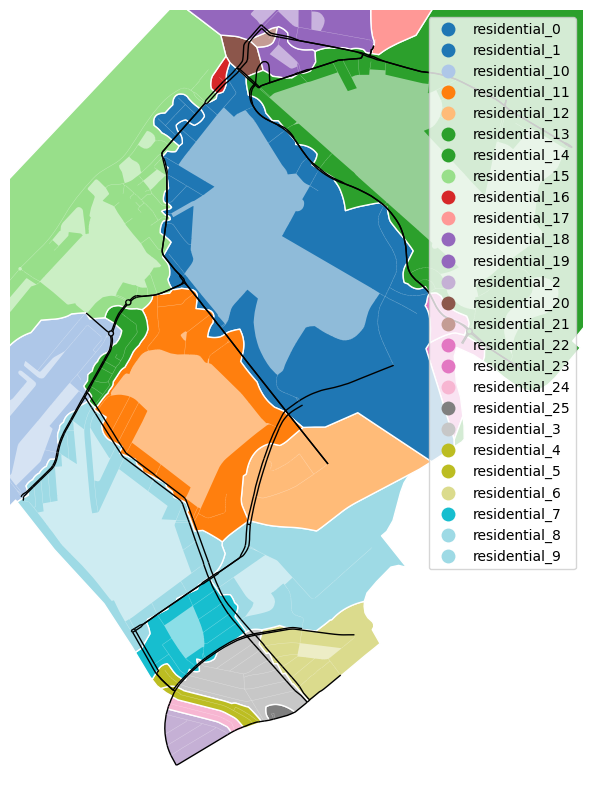

In [222]:
tessellation_gdf = tessellation.tessellation
fig, axe = plt.subplots(figsize=(10, 10))
tessellation_gdf.plot(ax=axe, edgecolor="white", column="partition_id", legend=True,
                      cmap="tab20")
borders.plot(ax=axe, color="white", alpha=0.5, facecolor="white")
ox.plot_graph(part.sparsified, ax=axe, node_size=0, edge_color="black",
              edge_linewidth=1)
axe.set_axis_off()
plt.show()

### Enclosed tessellation

Enclosed tessellation is a special case of morphological tessellation. It is
based on the same principle, but it is done for each enclosure separately. Enclosure
is a polygonal area enclosed by primary barriers (e.g. roads). Enclosed tessellation
is useful for example for analysis of building plots. As the enclosures can be
handled separately, this approach is more efficient.
In our case we know that the sparsified network functions as barrier for LTNs, so we
create enclosures (polygonize) from it first.

In [314]:
# Enclosed tessellation based on given buildings ``gdf`` within ``enclosures``.
edges_sparsified = ox.graph_to_gdfs(part.sparsified, nodes=False, edges=True,
                                    node_geometry=False)
enclosures = mm.enclosures(
    primary_barriers=gpd.GeoDataFrame(
        geometry=part.graph.graph["boundary"].difference(
            gpd.GeoSeries(edges_sparsified.buffer(5)
                          .unary_union)),
        crs=part.graph.graph["boundary_crs"]
    ),
    limit=  #mm.buffered_limit(borders, 1).convex_hull,
    gpd.GeoSeries(
        [part.graph.graph["boundary"]],
        crs=part.graph.graph["boundary_crs"]
    ),
    enclosure_id="eID",
)
enclosures.explore(column="eID")

Note the big enclosure around the whole graph. This is because the simplified network
does not reach to the boundary of the graph, so it is contained in one. But other
polygons are contained inside.

In [315]:
t0 = datetime.now()
tessellation = mm.Tessellation(borders, unique_id="partition_id",
                               enclosures=enclosures, enclosure_id="eID",
                               use_dask=False)
time_enclosed_tess = datetime.now() - t0

/home/carlsonb/miniconda3/envs/OSMnxPyrLab/lib/python3.10/site-packages/momepy/elements.py:457: FutureWarning: The `query_bulk()` method is deprecated and will be removed in GeoPandas 1.0. You can use the `query()` method instead.
  inp, res = buildings.sindex.query_bulk(


In [316]:
tessellation_gdf = tessellation.tessellation

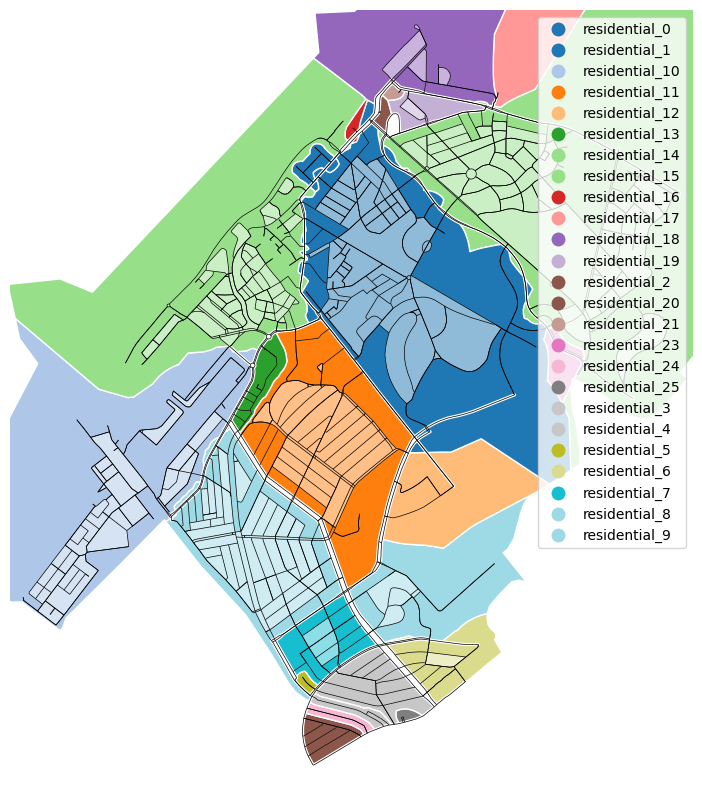

In [317]:
fig, axe = plt.subplots(figsize=(10, 10))
tessellation_gdf.plot(ax=axe, edgecolor="white", column="partition_id", legend=True,
                      cmap="tab20")
borders.plot(ax=axe, color="white", alpha=0.5, facecolor="white")
ox.plot_graph(part.graph, ax=axe, node_size=0, edge_color="black", edge_linewidth=0.5)
axe.set_axis_off()
plt.show()

The enclosed tesselation takes less time, and the tesselation cells are cleaner, for
the enclosed areas. The execution times are:

In [318]:
print(f"Full tessellation: {time_full_tess}")
print(f"Enclosed tessellation: {time_enclosed_tess}")
print(f"Enclosed tessellation is {time_full_tess / time_enclosed_tess} times faster.")

Full tessellation: 0:00:27.285891
Enclosed tessellation: 0:00:20.136918
Enclosed tessellation is 1.3550182306944887 times faster.


For bigger graphs the difference is expected to be larger.

## Indepentent tessellation

When looking into the code, `momepy` uses `scipy.spatial.Voronoi` to generate the
tessellation for every enclosure. This is done with a dense point array for the
geometry boundaries (borders in our case).

As we want to calculate area and population for each Partition, we can save time by
calculating the Voronoi diagram once for the whole graph/city (to keep it light only
for nodes), and save `area` and `population` for each note. Later we can use this data
to calculate the area and population for each Partition.

In [445]:
import pandas as pd
import numpy as np
from scipy.spatial import Voronoi, voronoi_plot_2d

### Nodes

In [377]:
nodes = ox.graph_to_gdfs(part.graph, nodes=True, edges=False)
nodes.explore(column="street_count")

In [378]:
nodes

,y,x,street_count,lon,lat,representative_node_name,split,geometry
osmid,,,,,,,,
27372680,5.774061e+06,587424.011278,1.0,4.276626,52.110174,NaN,NaN,POINT (587424.011 5774060.894)
1428324110,5.774022e+06,587464.783447,3.0,4.277212,52.109820,NaN,NaN,POINT (587464.783 5774022.261)
27457350,5.773575e+06,587695.118664,3.0,4.280459,52.105760,NaN,NaN,POINT (587695.119 5773574.589)
27458481,5.773627e+06,587639.939662,3.0,4.279667,52.106239,NaN,NaN,POINT (587639.940 5773626.917)
45268282,5.773613e+06,587721.009144,3.0,4.280847,52.106100,NaN,NaN,POINT (587721.009 5773612.905)
...,...,...,...,...,...,...,...,...
21460417939849034933065779376570954951,5.774273e+06,587767.418656,NaN,NaN,NaN,residential_16,True,POINT (587767.419 5774272.894)
204815373663988500631297518930820212403,5.770852e+06,587679.984340,NaN,NaN,NaN,residential_24,True,POINT (587679.984 5770851.581)
127020158986864215998339345943899828676,5.770849e+06,588043.876351,NaN,NaN,NaN,residential_25,True,POINT (588043.876 5770848.973)


In [464]:
# get numpy array with x, y coordinates of the nodes
node_points = nodes[["x", "y"]].to_numpy()
node_points

array([[ 587424.01127838, 5774060.89368338],
       [ 587464.78344683, 5774022.26087357],
       [ 587695.11866386, 5773574.58852615],
       ...,
       [ 588043.87635146, 5770848.97266505],
       [ 587913.32033451, 5774376.75248334],
       [ 588029.89077057, 5774499.08771641]])

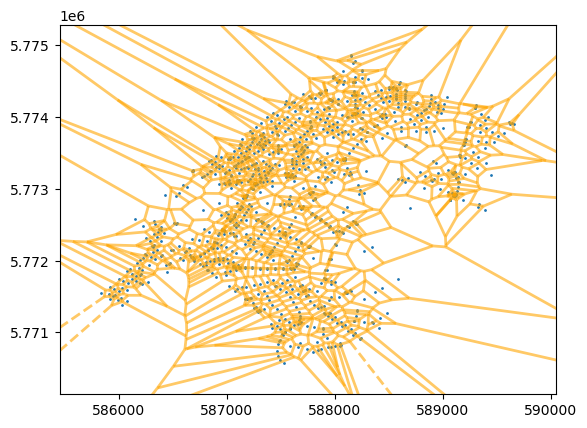

In [465]:
node_voronoi_diagram = Voronoi(node_points)
fig = voronoi_plot_2d(node_voronoi_diagram, show_vertices=False, line_colors='orange',
                      line_width=2, line_alpha=0.6, point_size=2)
plt.show()

In [466]:
# Construct cell polygons for each node
node_vertices = pd.Series(node_voronoi_diagram.regions).take(
    node_voronoi_diagram.point_region)
node_polygons = []
for region in node_vertices:
    if -1 not in region:
        node_polygons.append(
            shp.polygons(node_voronoi_diagram.vertices[region]).intersection(
                part.graph.graph["boundary"]))
    else:
        node_polygons.append(None)

node_polygons

[<POLYGON ((587415.572 5774011.156, 587114.548 5774256.316, 587207.959 577435...>,
 <POLYGON ((587524.971 5774072.912, 587508.79 5774009.556, 587470.911 5773969...>,
 <POLYGON ((587672.495 5773605.989, 587683.458 5773610.373, 587715.666 577358...>,
 <POLYGON ((587606.561 5773658.728, 587627.474 5773676.536, 587672.495 577360...>,
 <POLYGON ((587709.48 5773654.908, 587790.095 5773643.944, 587799.312 5773633...>,
 <POLYGON ((587657.544 5773586.978, 587703.021 5773556.046, 587685.923 577353...>,
 <POLYGON ((587627.474 5773676.536, 587635.489 5773689.802, 587690.654 577368...>,
 <POLYGON ((587596.27 5770689.687, 587626.957 5770660.076, 587504.656 5770591...>,
 <POLYGON ((587556.788 5770722.116, 587594.191 5770692.961, 587596.27 5770689...>,
 <POLYGON ((587594.191 5770692.961, 587629.826 5770835.808, 587707.395 577081...>,
 <POLYGON ((587515.203 5770786.816, 587556.788 5770722.116, 587464.23 5770705...>,
 <POLYGON ((587707.395 5770810.704, 587757.313 5770847.907, 587796.69 5770806...>,
 <PO

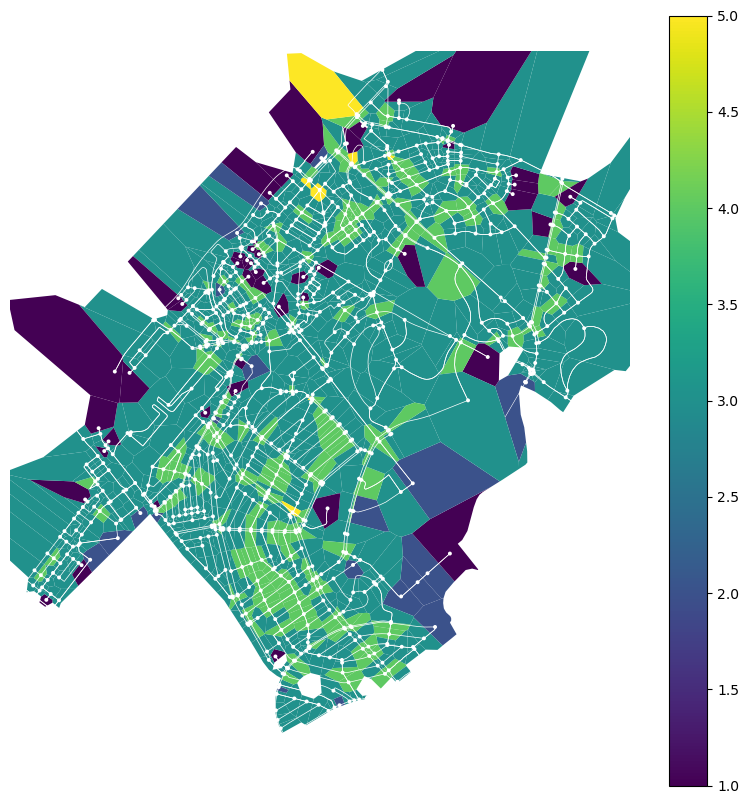

(<Figure size 1000x1000 with 2 Axes>, <Axes: >)

In [467]:
# Create GeoDataFrame with the polygons
node_poly_gdf = gpd.GeoDataFrame(geometry=node_polygons,
                                 crs=part.graph.graph["boundary_crs"],
                                 index=nodes.index)
# get street_count column from nodes
node_poly_gdf["street_count"] = nodes["street_count"]
# plot with street_count as color with colormap
fig, axe = plt.subplots(figsize=(10, 10))
node_poly_gdf.plot(column="street_count", ax=axe, legend=True)
ox.plot_graph(part.graph, ax=axe, node_size=8, edge_color="white", edge_linewidth=0.5,
              node_color="white")
# poly_gdf.explore(column="street_count")

Now show which partition they would make with the Partitioner `part`.

In [469]:
# Add cell polygon to the graph for each node
for node in part.graph.nodes:
    part.graph.nodes[node]["cell"] = node_poly_gdf.loc[node, "geometry"]
# For each partition create boundary as union of cells
for p, p_order in zip(part.partitions, part.get_partition_nodes()):
    p["boundary"] = shp.unary_union(
        [part.graph.nodes[node]["cell"] for node in p_order["nodes"]])

In [470]:
gpd.GeoDataFrame(
    geometry=[p["boundary"] for p in part.partitions],
    crs=part.graph.graph["boundary_crs"],
    data=[p["name"] for p in part.partitions],
    columns=["partition_id"]
).explore(column="partition_id")

These cells are a bit too rough, but we can make them smoother by creating the
Voronoi diagram with a dense point array, like the Momepy Tessellation does.

### Edges

Also, let's depart from the nodes and use the edges instead. This way we also dodge
the intricacy that nodes are shared between partitions, edges are not.

In [603]:
edges = ox.graph_to_gdfs(part.graph.to_undirected(as_view=True),
                         nodes=False,
                         edges=True,
                         node_geometry=False,
                         fill_edge_geometry=True)
# edges = edges["geometry"]
edges

osmid   
u           v                                       key                       
27372680    1428324110                              0             129465655  \
1428324110  6520144087                              0             129465655   
            45288301                                0    [7495377, 7495275]   
27457350    27458481                                0               4478977   
            45266004                                0             208063030   
...                                                                     ...   
9933911756  9933911753                              0            1084033748   
7646260841  7646260844                              0             818760076   
            7646260838                              0             818760076   
10805243559 264304421798571645878830003405962378082 0            1161779621   
10805243565 137192156104186169657561221210861560278 0            1161779620   

                                                             highway   length   
u           v                                       key                         
27372680    1428324110                              0    residential   56.075  \
1428324110  6520144087                              0    residential   81.225   
            45288301                                0    residential  156.110   
27457350    27458481                                0    residential   75.920   
            45266004                                0    residential   21.749   
...                                                              ...      ...   
9933911756  9933911753                              0    residential   27.287   
7646260841  7646260844                              0      secondary    7.377   
            7646260838                              0      secondary    7.375   
10805243559 264304421798571645878830003405962378082 0    residential   12.742   
10805243565 137192156104186169657561221210861560278 0    residential   23.111   

                                                         speed_kph   
u           v                                       key              
27372680    1428324110                              0         30.0  \
1428324110  6520144087                              0         30.0   
            45288301                                0         30.0   
27457350    27458481                                0         35.9   
            45266004                                0         30.0   
...                                                            ...   
9933911756  9933911753                              0         50.0   
7646260841  7646260844                              0         50.0   
            7646260838                              0         50.0   
10805243559 264304421798571645878830003405962378082 0         35.9   
10805243565 137192156104186169657561221210861560278 0         35.9   

                                                         travel_time  bearing   
u           v                                       key                         
27372680    1428324110                              0            6.7   134.54  \
1428324110  6520144087                              0            9.7   134.54   
            45288301                                0           18.7    44.50   
27457350    27458481                                0            7.6   314.56   
            45266004                                0            2.6   215.16   
...                                                              ...      ...   
9933911756  9933911753                              0            2.0     3.65   
7646260841  7646260844                              0            0.5   153.55   
            7646260838                              0            0.5   120.74   
10805243559 264304421798571645878830003405962378082 0            1.3   259.90   
10805243565 137192156104186169657561221210861560278 0            2.3    41.94   

                       

Now we will create an array with of points along the edges,

In [604]:
# get multiindex of first row
distance = 10
# The maximum distance between points after discretization.
edge_points = []
edge_indices = []
for m_idx, edge in edges.iterrows():
    if edge["length"] < 2 * distance:
        # for edges that would result in no or one point, take the middle
        pts = [shp.line_interpolate_point(edge["geometry"], 0.5, normalized=True)]
    else:
        # interpolate points along the line
        pts = shp.line_interpolate_point(
            edge["geometry"],
            np.linspace(0.1, edge["length"] - 0.1,
                        num=int((edge["length"] - 0.1) // distance)),
        )  # offset to keep nodes out
    edge_points.append(shp.get_coordinates(pts))
    # get multi_indices of first row
    edge_indices += [m_idx] * len(pts)

points = np.vstack(edge_points)

points

array([[ 587424.08386783, 5774060.82490277],
       [ 587434.22370668, 5774051.21711195],
       [ 587444.36354554, 5774041.60932112],
       ...,
       [ 587916.45505049, 5774377.36718894],
       [ 588022.15958313, 5774490.6010817 ],
       [ 588029.89077057, 5774499.08771641]])

<Axes: >

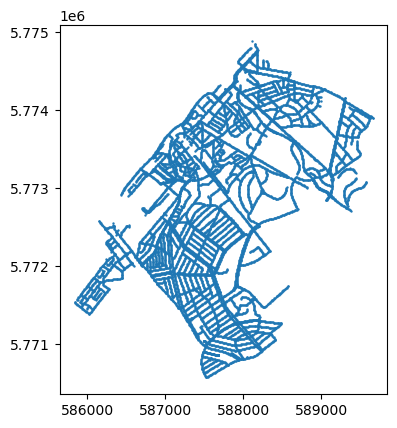

In [605]:
gpd.GeoDataFrame(geometry=[shp.Point(p) for p in points],
                 crs=part.graph.graph["boundary_crs"]).plot(markersize=0.5)

Now we know for each point, which edge it belongs to. We can use this to calculate the
Voronoi diagram.

Before we continue, let's also introduce a hull around the points, so that the outer
edge cells are not infinite or too large. As a hull we can use the boundary polygon
of the graph from OSM, as used in the node approach, or a buffered union of the edge
geometries. Then we can also split up the hull into points and add them to the points
array.

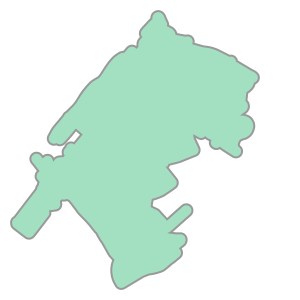

In [606]:
# get hull from the graph boundary
# hull = part.graph.graph["boundary"]
hull = shp.Polygon(edges.unary_union.buffer(100).exterior)
hull

In [607]:
# interpolate points along the hull
hull_points = shp.line_interpolate_point(
    hull.boundary,
    np.linspace(0.1, hull.length - 0.1, num=int(hull.length // distance)),
)
# add hull points to the points array
points = np.vstack([points, shp.get_coordinates(hull_points)])
# add edge indices to the edge_indices array
edge_indices += [-1] * len(hull_points)

In [608]:
edge_voronoi_diagram = Voronoi(points)

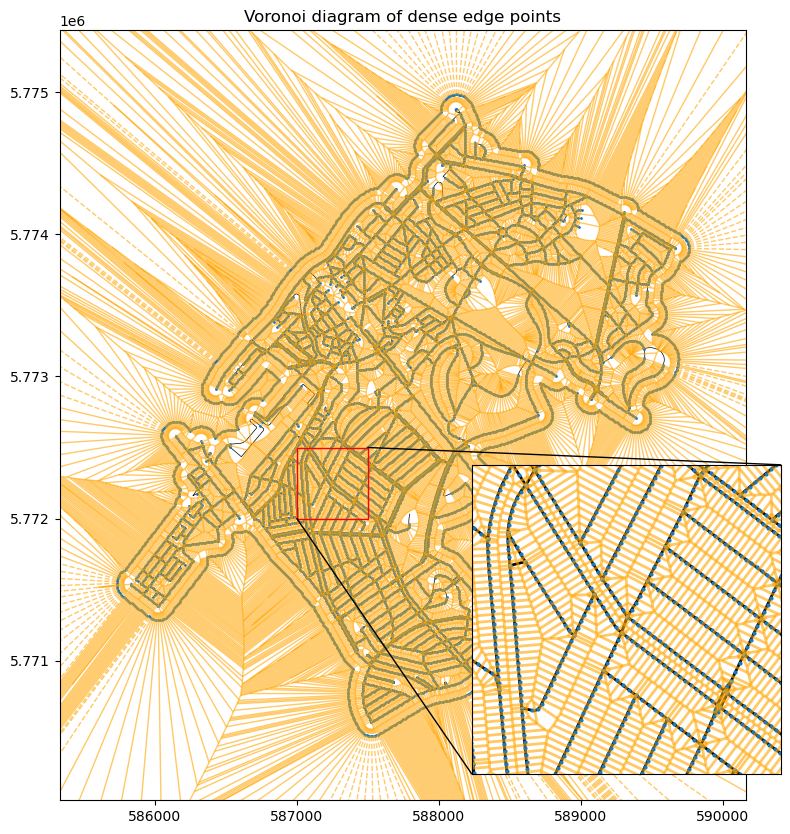

In [609]:
from matplotlib.patches import Rectangle, ConnectionPatch

# Plot with inset axes
fig, axe = plt.subplots(figsize=(10, 10))
zoom_window = (587000, 587500, 5772000, 5772500)

edges.plot(ax=axe, color="black", linewidth=0.5)
voronoi_plot_2d(edge_voronoi_diagram, ax=axe, show_vertices=False, line_colors='orange',
                line_width=1, line_alpha=0.6, point_size=2)
axe.set_title("Voronoi diagram of dense edge points")
# Create inset axes
axins = axe.inset_axes([0.6, 0.01, 0.45, 0.45])
edges.plot(ax=axins, color="black", linewidth=2)
voronoi_plot_2d(edge_voronoi_diagram, ax=axins, show_vertices=False,
                line_colors='orange',
                line_width=2, line_alpha=0.6, point_size=4)
axins.set_xlim(*zoom_window[:2])
axins.set_ylim(*zoom_window[2:])
axins.set_xticks([])
axins.set_yticks([])
# Indicate zoom window
rect = Rectangle((zoom_window[0], zoom_window[2]), zoom_window[1] - zoom_window[0],
                 zoom_window[3] - zoom_window[2], linewidth=1, edgecolor='r',
                 facecolor='none', zorder=10)
axe.add_patch(rect)
# Connect zoom window to inset
axe.add_artist(
    ConnectionPatch(xyA=(zoom_window[0], zoom_window[2]),
                    xyB=(zoom_window[0], zoom_window[2]),
                    coordsA="data", coordsB="data", axesA=axe, axesB=axins,
                    linewidth=1, zorder=10))
axe.add_artist(
    ConnectionPatch(xyA=(zoom_window[1], zoom_window[3]),
                    xyB=(zoom_window[1], zoom_window[3]),
                    coordsA="data", coordsB="data", axesA=axe, axesB=axins,
                    linewidth=1, zorder=10))
plt.show()

Let's see how the cells look like for the Partitioner `part`.

In [610]:
# Construct cell polygons for each of the dense points
point_vertices = pd.Series(edge_voronoi_diagram.regions).take(
    edge_voronoi_diagram.point_region)
point_polygons = []
for region in point_vertices:
    if -1 not in region:
        point_polygons.append(
            shp.polygons(edge_voronoi_diagram.vertices[region]).intersection(
                part.graph.graph["boundary"]))
    else:
        point_polygons.append(None)

# Create GeoDataFrame with cells and edge multiindex
edge_poly_gdf = gpd.GeoDataFrame(
    geometry=point_polygons,
    crs=part.graph.graph["boundary_crs"],
    index=edge_indices,
    columns=["geometry"],
)
# Drop cells that are outside the boundary
edge_poly_gdf = edge_poly_gdf.loc[edge_poly_gdf.index != -1]
# Dissolve cells by edge multiindex
edge_poly_gdf = edge_poly_gdf.dissolve(by=edge_poly_gdf.index)
edge_poly_gdf

,geometry
"(27372680, 1428324110, 0)","POLYGON ((587432.165 5773998.271, 587422.337 5..."
"(27457350, 27458481, 0)","POLYGON ((587685.279 5773573.529, 587682.137 5..."
"(27457350, 45266004, 0)","POLYGON ((587682.871 5773556.602, 587665.414 5..."
"(27457350, 45268282, 0)","POLYGON ((587691.802 5773598.747, 587692.720 5..."
"(27458481, 45268279, 0)","POLYGON ((587610.407 5773643.402, 587616.904 5..."
...,...
"(10805243558, 1427521993, 0)","POLYGON ((587897.389 5774403.222, 587897.634 5..."
"(10805243558, 264304421798571645878830003405962378082, 0)","POLYGON ((587911.012 5774380.561, 587923.363 5..."
"(10805243559, 264304421798571645878830003405962378082, 0)","POLYGON ((587911.012 5774380.561, 587923.363 5..."
"(10805243561, 137192156104186169657561221210861560278, 0)","POLYGON ((588029.913 5774442.996, 587982.728 5..."


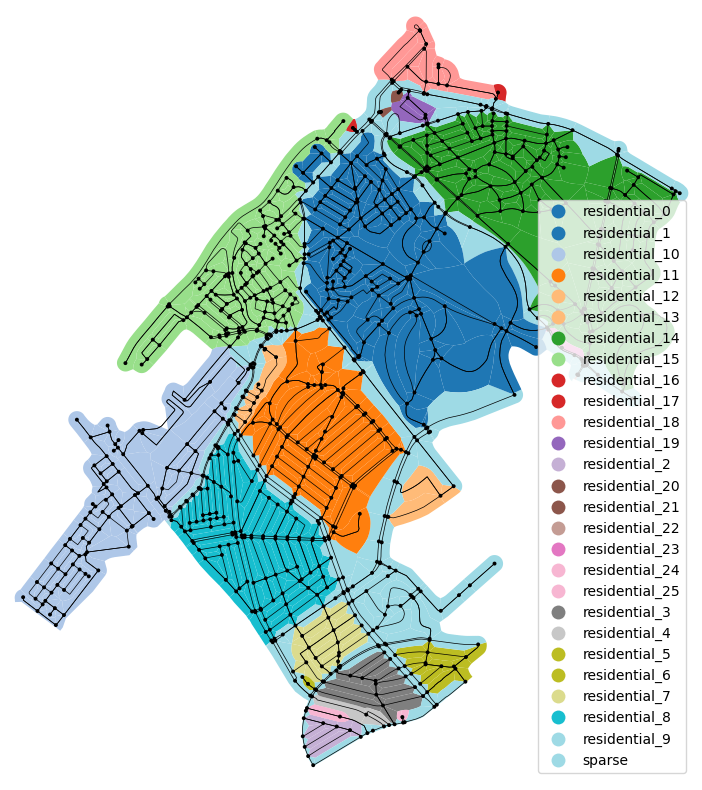

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [611]:
# bearing_90, component_name, residential, length
edge_poly_gdf["component_name"] = edges["component_name"]
# Set NaNs to "sparse"
edge_poly_gdf["component_name"] = edge_poly_gdf["component_name"].fillna("sparse")
# Plot with color by edge label
fig, axe = plt.subplots(figsize=(10, 10))
edge_poly_gdf.plot(column="component_name", ax=axe, legend=True, cmap="tab20")
ox.plot_graph(part.graph, ax=axe, node_size=8, edge_color="black", edge_linewidth=0.5,
              node_color="black")

Much better!

In [612]:
# Interactive explore map with unions of partitions
edge_poly_gdf.dissolve(by="component_name", as_index=False).explore(column="component_name", cmap="tab20")